In [8]:
import matplotlib
import matplotlib.axes
import matplotlib.cm
from matplotlib import pyplot as plt
from matplotlib.figure import Figure
import json
import numpy
import numpy.typing
import numpy as np
import pickle
import os, sys

os.environ['NUMEXPR_MAX_THREADS'] = '32'
lib_path = os.path.abspath(os.path.join('..'))
sys.path.append(lib_path)

from report_generator.traj_loading import load_model_traj_npy, ModelTraj
from report_generator.tica_plots import TicaModel, calc_atom_distance, transform_tica_datas
from report_generator.reaction_coordinate import calc_reaction_coordinate, ReactionCoordKde
from report_generator.contact_maps import make_contact_map_plot, make_contact_map, ContactMap
from report_generator.bond_and_angle_analysis import plot_bond_length_angles
from report_generator.kullback_leibler_divergence import kl_divergence, wasserstein
import scipy
import scipy.stats as st
import time
from tabulate import tabulate


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats



def make_tica_1ds_formatted(
    model_projected_data: np.ndarray,
    native_proj_datas_concat: np.ndarray,
    subtitles: list[str]
) -> None:
    N = len(subtitles)
    cols = 4
    rows = int(np.ceil(N / cols))
    
    # Create the figure and subplots
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 3 * rows), sharex=False, sharey=False)
    
    # Flatten axes for easy iteration in case it's a 2D array
    # (Matplotlib returns a 2D array when rows > 1 and cols > 1)
    axes = axes.flatten()

    for i, subtitle in enumerate(subtitles):    
        ax = axes[i]  # pick the i-th Axes
    
        # Compute range based on both model and native data
        xmin = np.min(model_projected_data[:, i])
        xmax = np.max(model_projected_data[:, i])
        xmin = min(xmin, np.min(native_proj_datas_concat[:, i]))
        xmax = max(xmax, np.max(native_proj_datas_concat[:, i]))
    
        # Generate data for plotting KDE
        Xs = np.linspace(xmin, xmax, num=100)
    
        # Model KDE
        model_kernel = scipy.stats.gaussian_kde(model_projected_data[:, i])
        Ys_model = model_kernel(Xs)
        ax.plot(Xs, Ys_model, c="red", label="model")
    
        # Native KDE
        native_kde = scipy.stats.gaussian_kde(native_proj_datas_concat[:, i])
        Ys_native = native_kde(Xs)
        ax.plot(Xs, Ys_native, c="blue", label="ground truth")
    
        ymax = max(Ys_model.max(), Ys_native.max())
        ax.set_ylim(0.0, 1.2 * ymax)
    
        # optionally set title or legend
        ax.set_title(f"TIC {i}")
        ax.legend()

    # If there are unused axes (e.g. because N is not exactly rows*cols), we can hide them.
    for j in range(N, rows * cols):
        axes[j].set_visible(False)

    # Adjust spacing
    plt.tight_layout()
    %matplotlib inline
    plt.show()


In [10]:
import numpy as np
import scipy.stats
import matplotlib.pyplot as plt


def make_tica_1ds(
    model_projected_data: np.ndarray,
    native_proj_datas_concat: np.ndarray,
    subtitles: list[str]
) -> None:
    for i, subtitle in enumerate(subtitles):
        # Create a new figure (or you can do one figure + subplots if you prefer)
        plt.figure(figsize=(4.5, 3))

        # Access current Axes to modify spines, etc.
        current_ax = plt.gca()
        current_ax.spines['right'].set_position(('outward', 80))
        plt.tick_params(axis='y')  # same as ax.tick_params('y')

        plt.xlabel(f"TIC {i}")

        # Compute range based on both model and native data
        xmin = np.min(model_projected_data[:, i])
        xmax = np.max(model_projected_data[:, i])
        xmin = min(xmin, np.min(native_proj_datas_concat[:, i]))
        xmax = max(xmax, np.max(native_proj_datas_concat[:, i]))

        # Generate data for plotting KDE
        Xs = np.linspace(xmin, xmax, num=100)

        # Model KDE
        model_kernel = scipy.stats.gaussian_kde(model_projected_data[:, i])
        Ys_model = model_kernel(Xs)
        plt.plot(Xs, Ys_model, c="red", label="model")

        # Native KDE
        native_kde = scipy.stats.gaussian_kde(native_proj_datas_concat[:, i])
        Ys_native = native_kde(Xs)
        plt.plot(Xs, Ys_native, c="blue", label="ground truth")

        # Adjust the y-limits a bit
        ymax = max(Ys_model.max(), Ys_native.max())
        plt.ylim(0.0, 1.2 * ymax)

        # Title and legend
        plt.title(subtitle)
        plt.legend()
    
        plt.show()


In [11]:
def show_ticas(benchmark) -> None:
    with open(benchmark) as f:
        benchmark_data = json.loads(f.read())

        for protein_name, info in benchmark_data["proteins"].items():
            print('Processing protein: ', protein_name)
            protein_name: str
            model_trajs: list[ModelTraj] = load_model_traj_npy(info["model_npy_path"])
            
            with open(info["tica_model"], 'rb') as tica_model_file:
                with open(info["all_native_file_strided"], 'rb') as all_native_file_strided:
                    tica_model = pickle.load(tica_model_file)
                    native_trajs_strided = pickle.load(all_native_file_strided)

                    assert isinstance(tica_model, TicaModel)
                    

                    make_figs(protein_name, model_trajs, native_trajs_strided, tica_model)


In [12]:
def make_figs(protein_name, model_trajs: list[ModelTraj], native_trajs_strided: list[ModelTraj],tica_model: TicaModel) -> tuple[Figure, float, float]:

    print("Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points")
    start_time = time.time()
    print('model_trajs', len(model_trajs), model_trajs[0].trajectory.n_frames)
    # take out the first 10% of frames in model_trajs as they are biased towards the starting points and thus towards the GT/native data (remember starting points are sampled from GT data)
    trajLen = model_trajs[0].trajectory.n_frames
    model_trajs = [t.filterFrames(start=int(trajLen/10)-1, end=-1) for t in model_trajs]
    print('model_trajs', len(model_trajs), model_trajs[0].trajectory.n_frames)

    model_tica_datas: list[numpy.typing.NDArray] = transform_tica_datas(tica_model, [calc_atom_distance(x.trajectory) for x in model_trajs])
    print('model_tica_datas', len(model_tica_datas), model_tica_datas[0].shape)
    model_projected_data = numpy.concatenate(model_tica_datas)
    print('model_projected_data', model_projected_data.shape)

    native_proj_datas: list[numpy.typing.NDArray]  = transform_tica_datas(tica_model,[calc_atom_distance(x.trajectory) for x in native_trajs_strided])
    strideNative = 10
    native_proj_datas_concat = numpy.concatenate(native_proj_datas)[::strideNative]
    print('native_proj_datas_concat', native_proj_datas_concat.shape)
    print("--- projected data %s seconds ---" % (time.time() - start_time))

    start_time = time.time()
    nrTICA1Dplots = min(model_projected_data.shape[1], native_proj_datas_concat.shape[1])
    print(nrTICA1Dplots)
    subtitles = ["PDF TICA component %d" % i for i in range(0, nrTICA1Dplots)]
    # make_tica_1ds(model_projected_data, native_proj_datas_concat, subtitles)
    make_tica_1ds_formatted(model_projected_data, native_proj_datas_concat, subtitles)
    print("--- TICA 1D plots %s seconds ---" % (time.time() - start_time))



/media/DATA_18_TB_1/benchmark_sims/000154_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2892699241638184 seconds ---
45


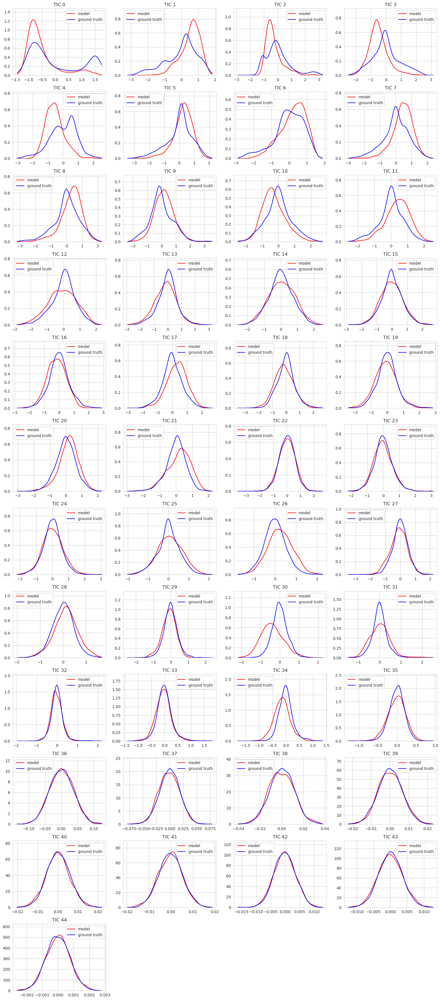

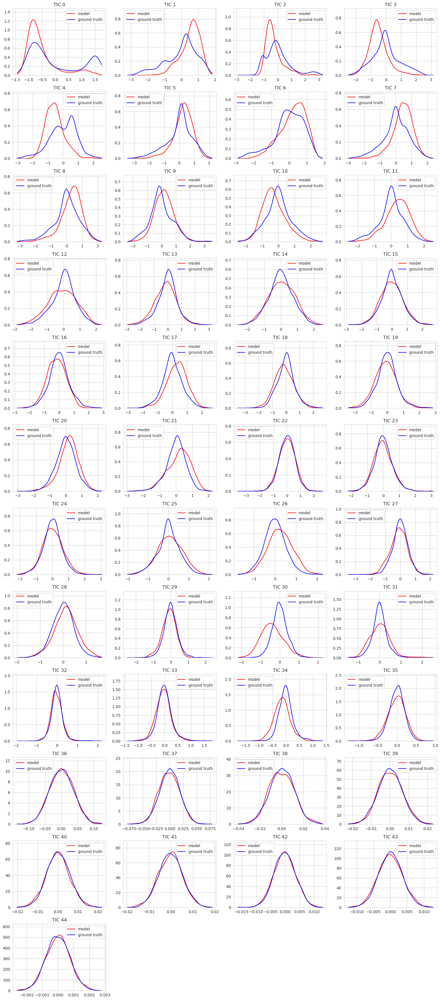

--- TICA 1D plots 9.462769269943237 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000155_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2798652648925781 seconds ---
45


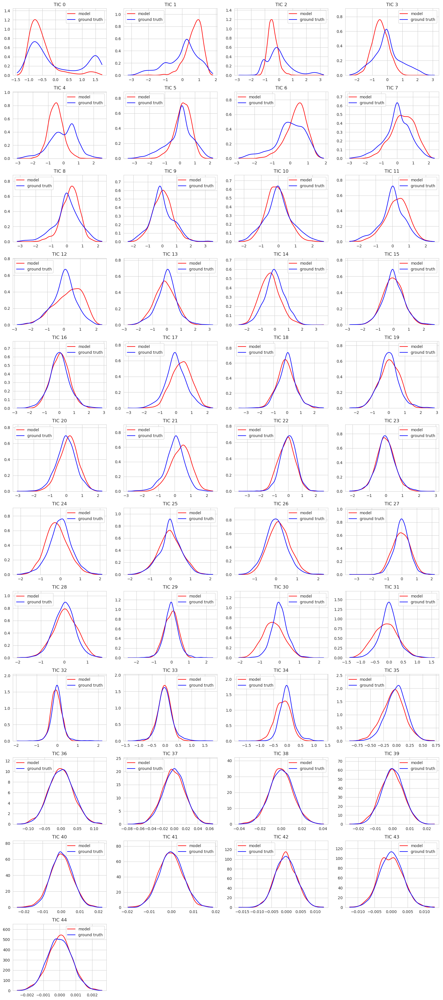

--- TICA 1D plots 6.183332443237305 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000156_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2815558910369873 seconds ---
45


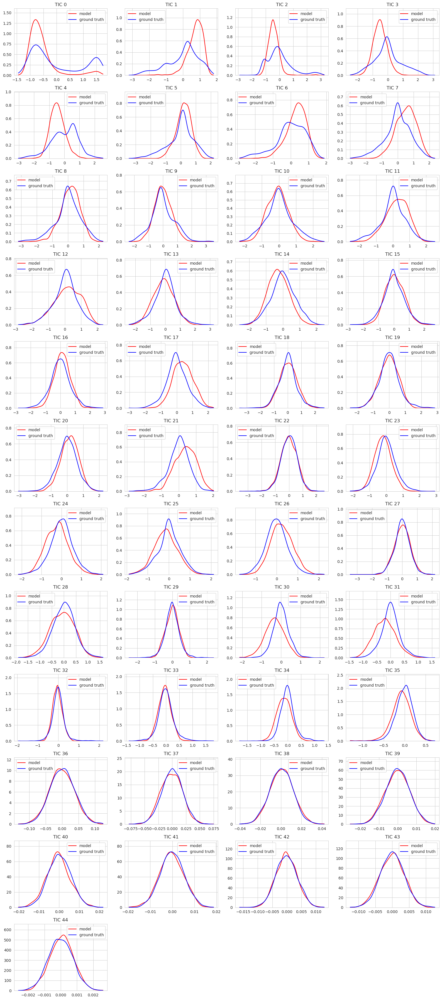

--- TICA 1D plots 5.8623433113098145 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000157_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2865967750549316 seconds ---
45


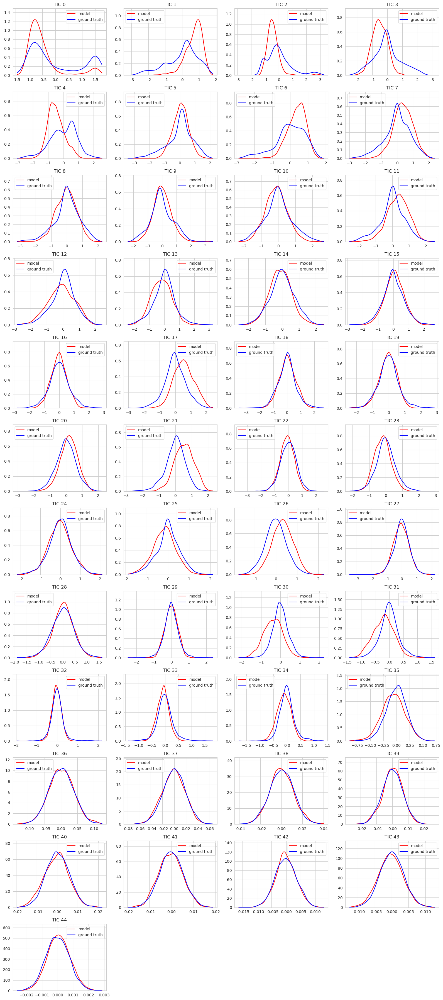

--- TICA 1D plots 5.9557576179504395 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000158_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2859985828399658 seconds ---
45


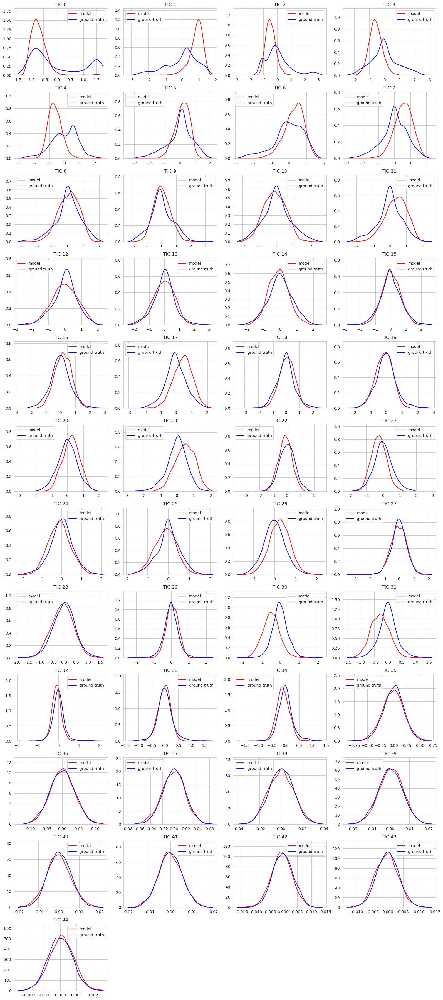

--- TICA 1D plots 5.740421533584595 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000159_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.286329746246338 seconds ---
45


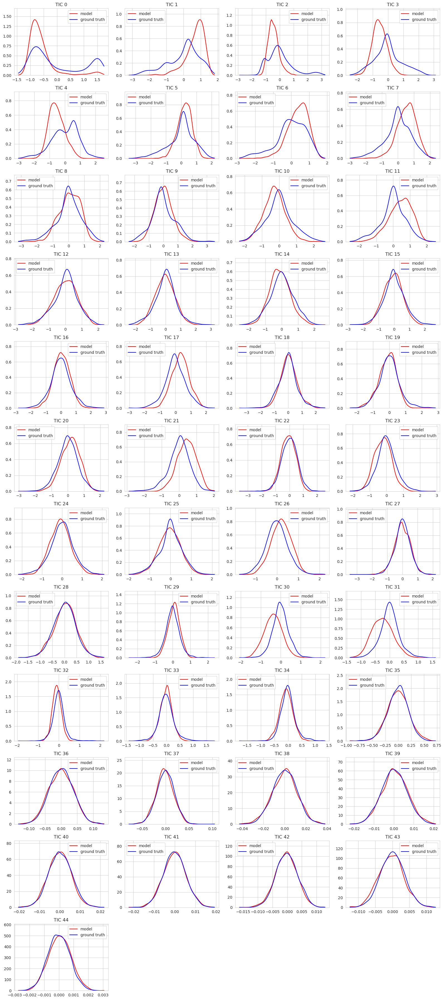

--- TICA 1D plots 5.912264585494995 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000160_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2843315601348877 seconds ---
45


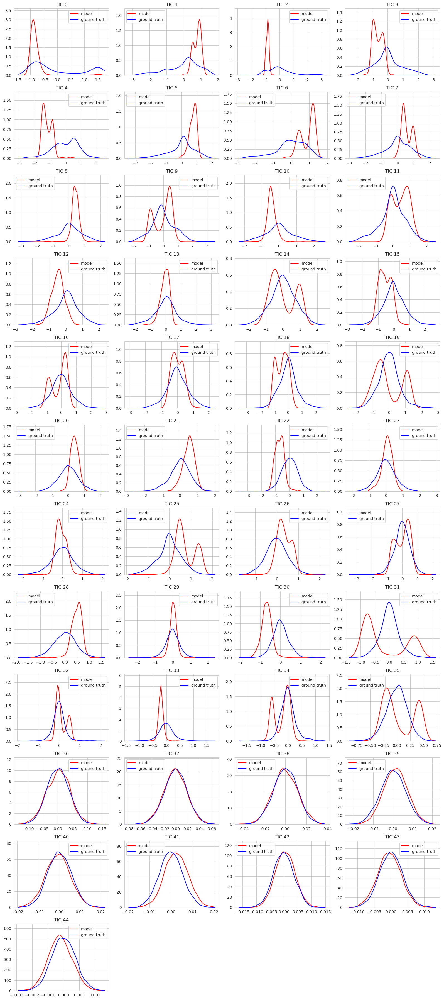

--- TICA 1D plots 5.680472135543823 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000161_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2822253704071045 seconds ---
45


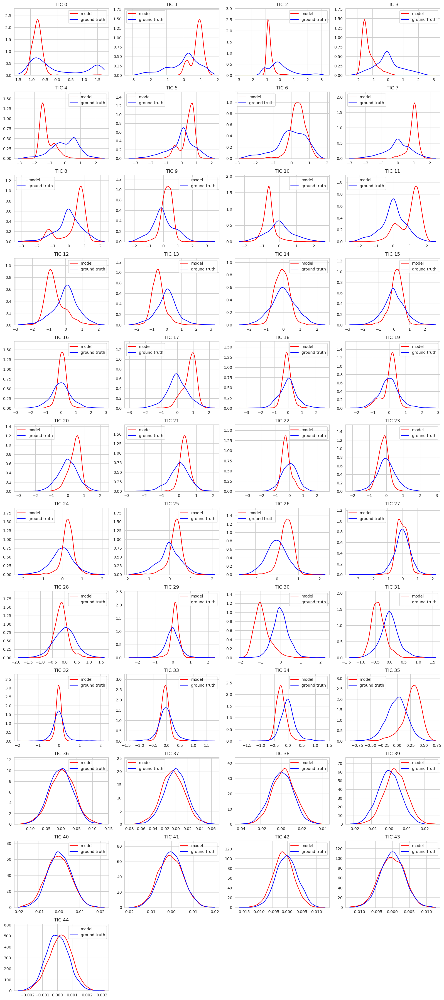

--- TICA 1D plots 6.00943660736084 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000162_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2860338687896729 seconds ---
45


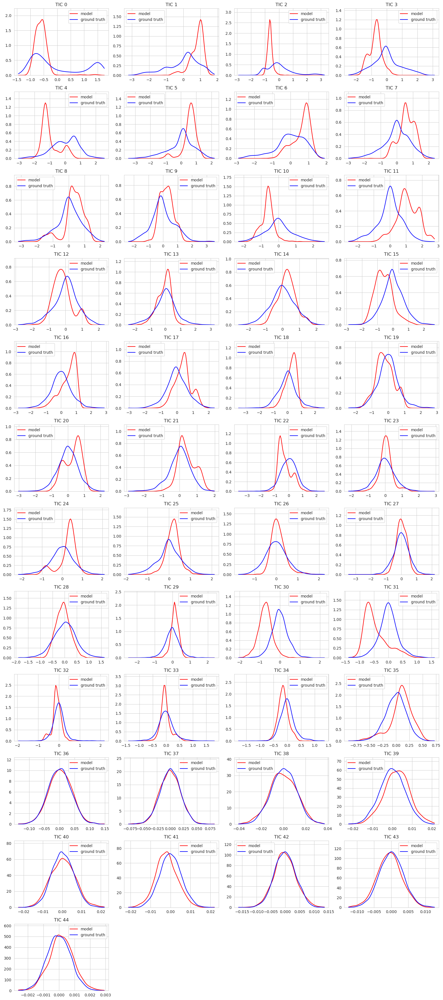

--- TICA 1D plots 5.651682615280151 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000163_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2871100902557373 seconds ---
45


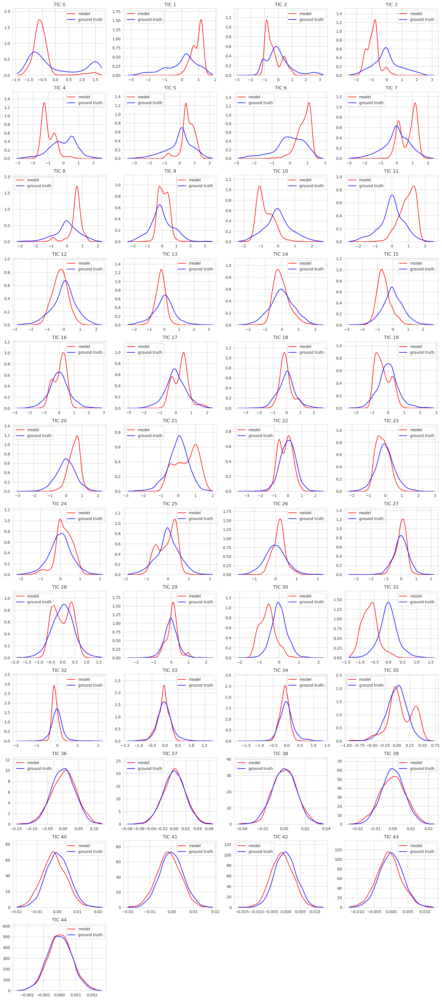

--- TICA 1D plots 6.112161636352539 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000164_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2818119525909424 seconds ---
45


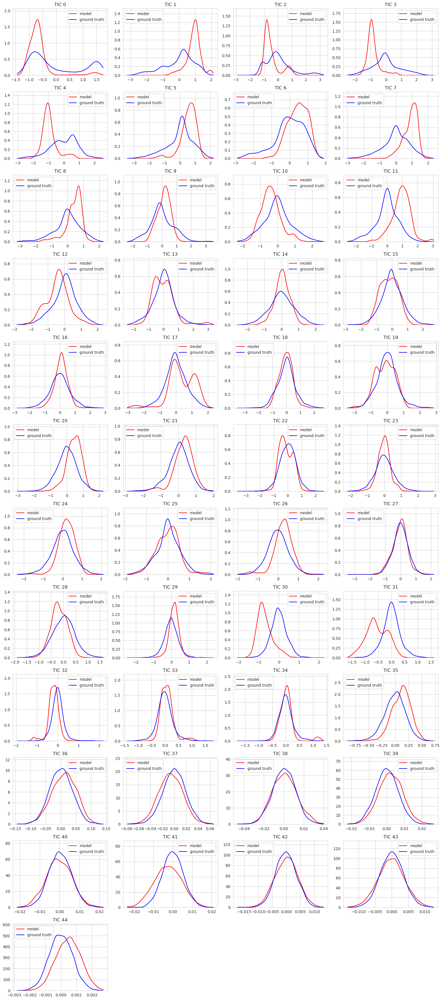

--- TICA 1D plots 5.675145149230957 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000165_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2628400325775146 seconds ---
45


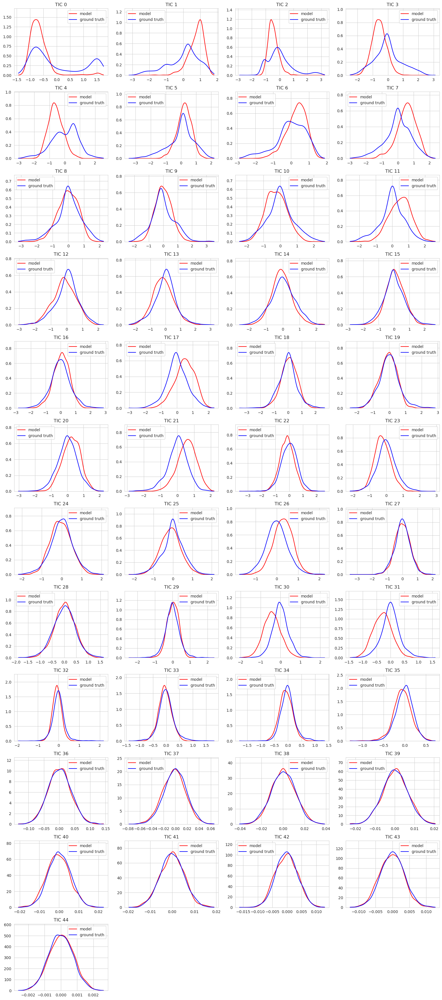

--- TICA 1D plots 5.462727785110474 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000166_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2638068199157715 seconds ---
45


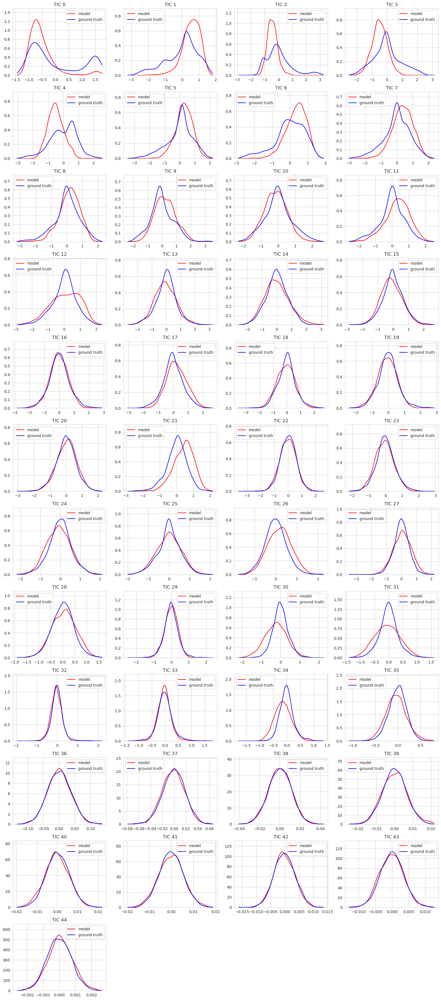

--- TICA 1D plots 5.743727922439575 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000167_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2635819911956787 seconds ---
45


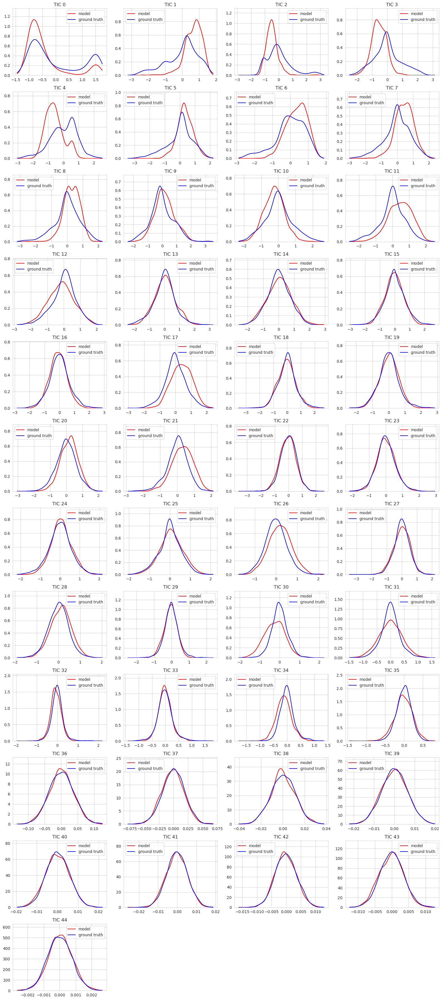

--- TICA 1D plots 5.594080209732056 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000168_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2635037899017334 seconds ---
45


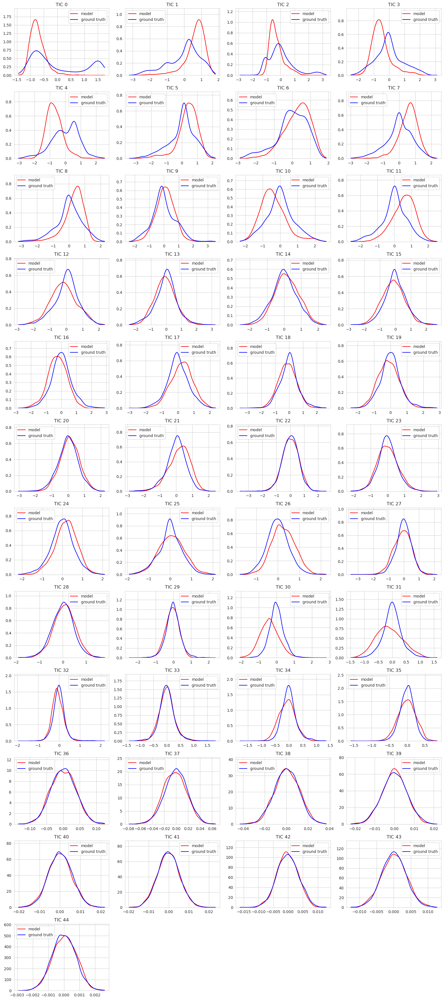

--- TICA 1D plots 5.688563823699951 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000169_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2640869617462158 seconds ---
45


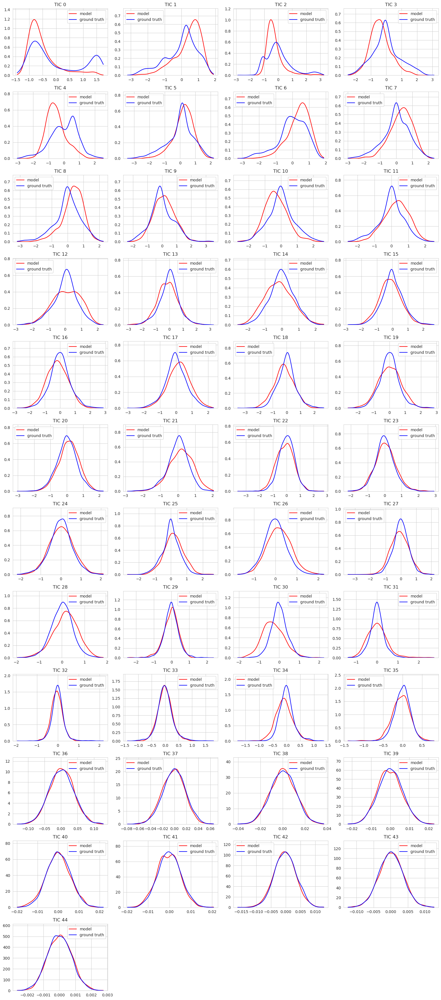

--- TICA 1D plots 5.7855870723724365 seconds ---
/media/DATA_18_TB_1/benchmark_sims/000170_/benchmark.json
Processing protein:  chignolin
mdtraj_list 20 <mdtraj.Trajectory with 100 frames, 10 atoms, 10 residues, without unitcells>
Take out the first 10%% of frames in model_trajs in order not to bias the model towards the starting points
model_trajs 20 100
model_trajs 20 90
model_tica_datas 20 (90, 45)
model_projected_data (1800, 45)
native_proj_datas_concat (3730, 45)
--- projected data 1.2661876678466797 seconds ---
45


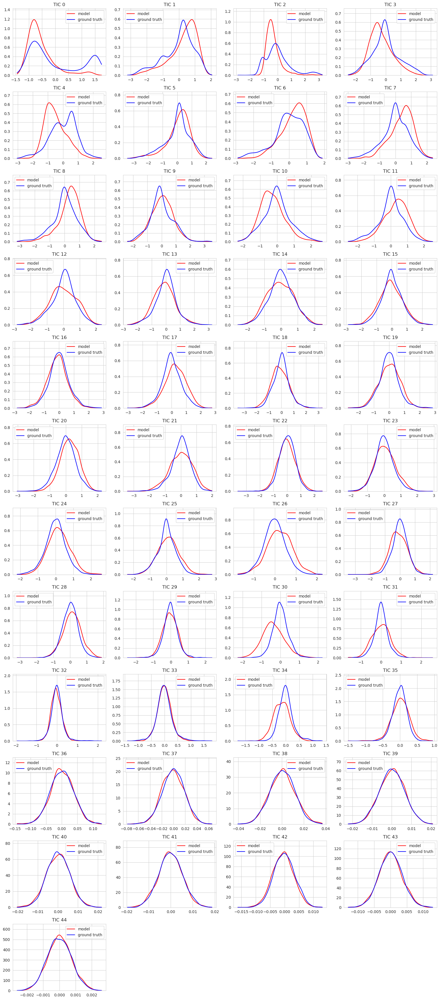

--- TICA 1D plots 5.532381296157837 seconds ---


In [13]:

import glob
import glob
import os

base_dir = "/media/DATA_18_TB_1/benchmark_sims"
start_num = 154
end_num   = 170

file_paths = []

for num in range(start_num, end_num + 1):
    dir_pattern = f"000{num}*"
    
    pattern = os.path.join(base_dir, dir_pattern, "benchmark.json")
    file_paths.extend(glob.glob(pattern))

file_paths.sort(key=lambda f: os.path.dirname(f))

for file_path in file_paths:
    print(file_path)
    show_ticas(file_path)
